# Use Diffusers

## 0. Prepare and Sign to Hugging Face

In [ ]:
# Login to hugging face for model downloading
from huggingface_hub import login
login()

## 1. Generate image from text

### 1.1 Use the default Stable Diffusion v1.5 model

In [2]:
# Load up model
import torch
from diffusers import StableDiffusionPipeline

text2img_pipe = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5"
    , torch_dtype = torch.float16
).to("cuda:0")

A matching Triton is not available, some optimizations will not be enabled.
Error caught was: No module named 'triton'
vae\diffusion_pytorch_model.safetensors not found
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


  0%|          | 0/50 [00:00<?, ?it/s]

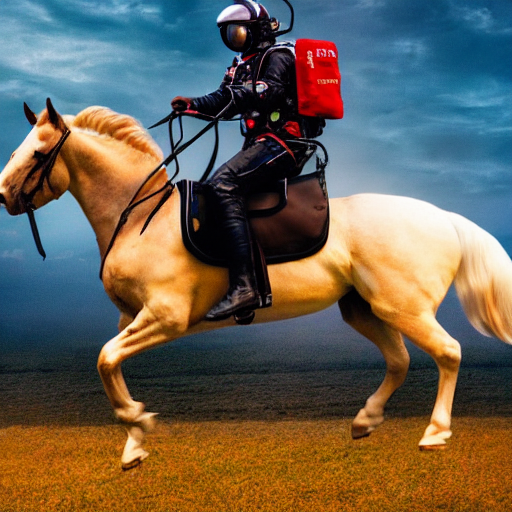

In [2]:
# generate an image
prompt = "high resolution, a photograph of an astronaut riding a horse"
image = text2img_pipe(
    prompt = prompt
).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

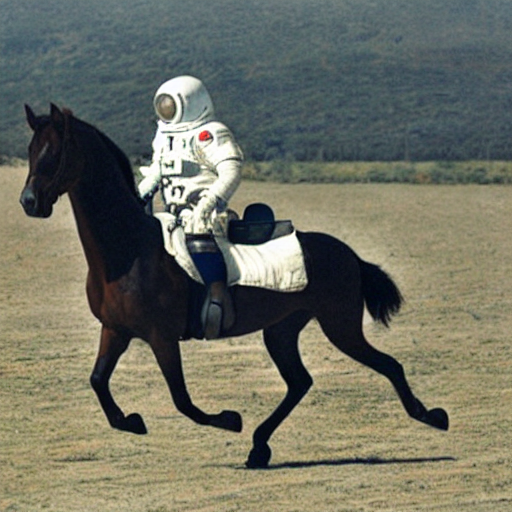

In [3]:
generator = torch.Generator("cuda:0").manual_seed(1234)
prompt = "high resolution, a photograph of an astronaut riding a horse"
image = text2img_pipe(
    prompt = prompt
    , generator = generator
).images[0]
display(image)

### 1.2 Scheduler

In [4]:
# Check out the current schduler
text2img_pipe.scheduler

PNDMScheduler {
  "_class_name": "PNDMScheduler",
  "_diffusers_version": "0.17.1",
  "beta_end": 0.012,
  "beta_schedule": "scaled_linear",
  "beta_start": 0.00085,
  "clip_sample": false,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "set_alpha_to_one": false,
  "skip_prk_steps": true,
  "steps_offset": 1,
  "trained_betas": null
}

  0%|          | 0/50 [00:00<?, ?it/s]

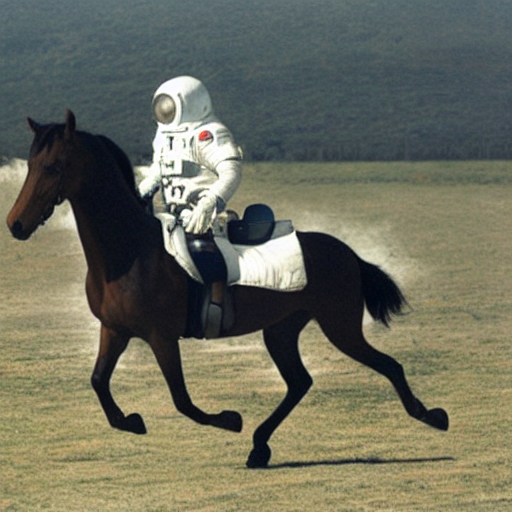

In [5]:
from diffusers import EulerDiscreteScheduler
text2img_pipe.scheduler = EulerDiscreteScheduler.from_config(text2img_pipe.scheduler.config)
generator = torch.Generator("cuda:0").manual_seed(1234)
prompt = "high resolution, a photograph of an astronaut riding a horse"
image = text2img_pipe(
    prompt = prompt
    , generator = generator
).images[0]
display(image)

  0%|          | 0/20 [00:00<?, ?it/s]

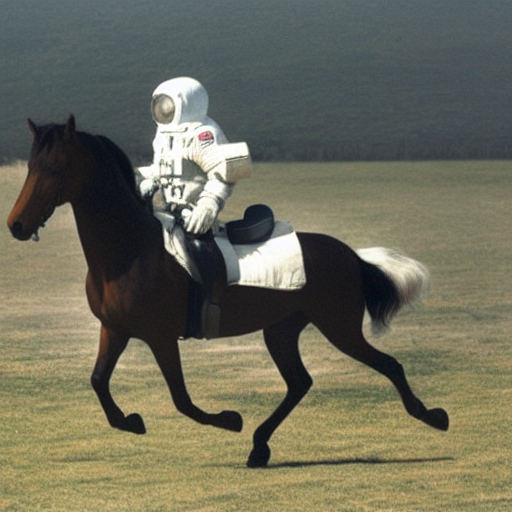

In [6]:
# Euler scheuler with 20 steps
from diffusers import EulerDiscreteScheduler
text2img_pipe.scheduler = EulerDiscreteScheduler.from_config(text2img_pipe.scheduler.config)
generator = torch.Generator("cuda:0").manual_seed(1234)
prompt = "high resolution, a photograph of an astronaut riding a horse"
image = text2img_pipe(
    prompt = prompt
    , generator = generator
    , num_inference_steps = 20
).images[0]
display(image)

  0%|          | 0/20 [00:00<?, ?it/s]

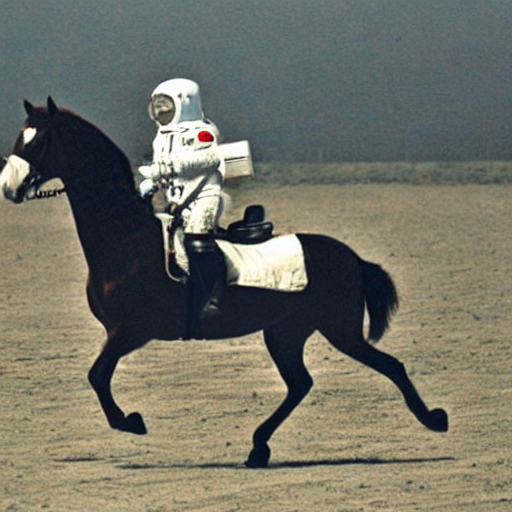

In [7]:
# PNDMScheduler scheuler with 20 steps
from diffusers import PNDMScheduler 
text2img_pipe.scheduler = PNDMScheduler .from_config(text2img_pipe.scheduler.config)
generator = torch.Generator("cuda:0").manual_seed(1234)
prompt = "high resolution, a photograph of an astronaut riding a horse"
image = text2img_pipe(
    prompt = prompt
    , generator = generator
    , num_inference_steps = 20
).images[0]
display(image)

### 1.3 Use the deliberate-v2 for better image

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/home/andrewzhu/storage_1t_1/az_git_folder/B21263_Using-Stable-Diffusion-with-Python_Content/sd_book_venv_p310/lib/python3.10/site-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


  0%|          | 0/50 [00:00<?, ?it/s]

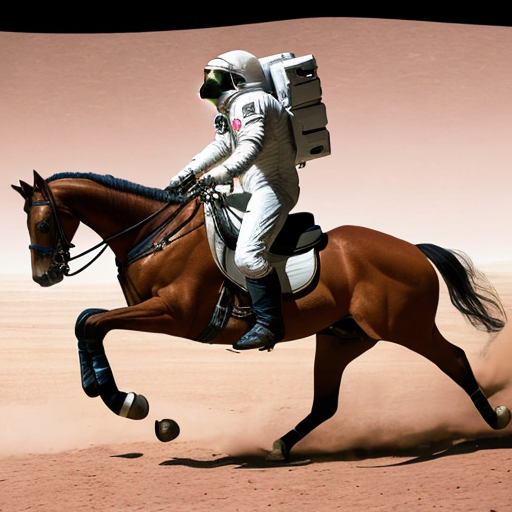

In [1]:
# Change model to "stablediffusionapi/deliberate-v2"
from diffusers import StableDiffusionPipeline
import torch
text2img_pipe = StableDiffusionPipeline.from_pretrained(
    "/home/andrewzhu/storage_1t_1/sd15_models/deliberate_v2"
    #"stablediffusionapi/deliberate-v2"
    , torch_dtype = torch.float16
).to("cuda:0")

prompt = "high resolution, a photograph of an astronaut riding a horse"
image = text2img_pipe(
    prompt = prompt
).images[0]
display(image)

#### 1.3.1 Generate image with deterministic generation

  0%|          | 0/50 [00:00<?, ?it/s]

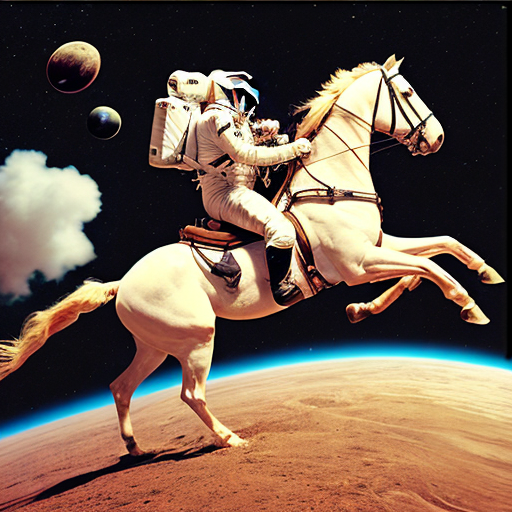

In [3]:
generator = torch.Generator("cuda:0").manual_seed(1)
prompt = "high resolution, a photograph of an astronaut riding a horse"
image = text2img_pipe(
    prompt = prompt
    , generator = generator
).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

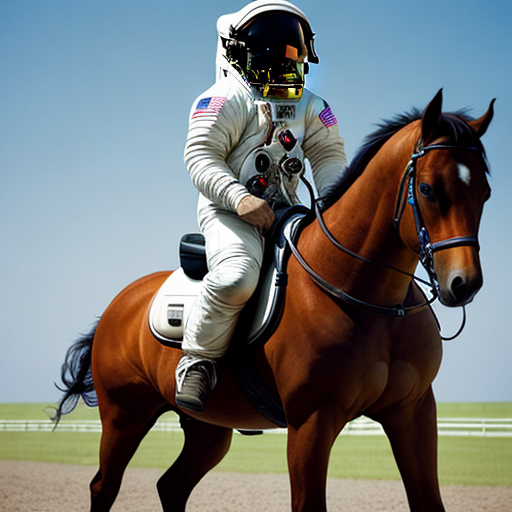

In [4]:
# use random generator, you will get different images every time run this cell
import random
seed = random.randint(1,999999)
generator = torch.Generator("cuda:0").manual_seed(seed)
prompt = "high resolution, a photograph of an astronaut riding a horse"
image = text2img_pipe(
    prompt = prompt
    , generator = generator
).images[0]
image

#### 1.3.2 Use DPMSolverMultistepScheduler scheduler

  0%|          | 0/50 [00:00<?, ?it/s]

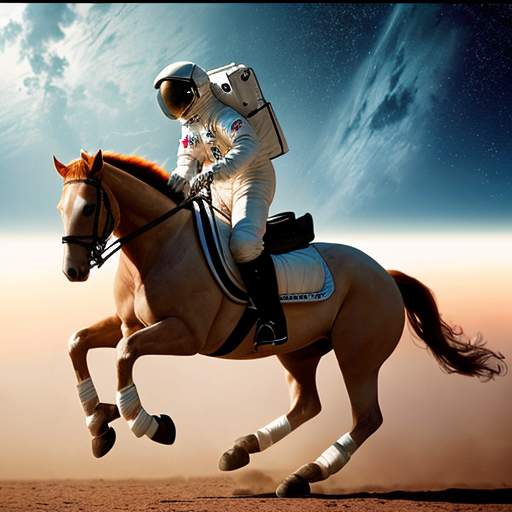

In [12]:
# Different scheduler will generate different images
from diffusers import DPMSolverMultistepScheduler
text2img_pipe.scheduler = DPMSolverMultistepScheduler.from_config(text2img_pipe.scheduler.config)
prompt = "high resolution, a photograph of an astronaut riding a horse"
image = text2img_pipe(
    prompt = prompt
    , generator = generator
).images[0]
image

#### 1.3.3 Specify inference steps

  0%|          | 0/30 [00:00<?, ?it/s]

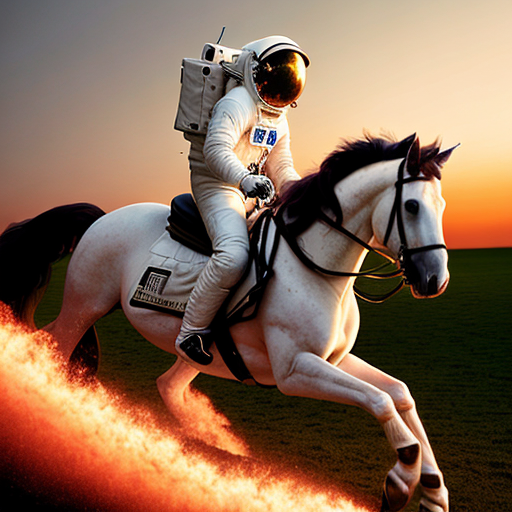

In [42]:
# Generate image using assigned steps
prompt = "high resolution, a photograph of an astronaut riding a horse"
image = text2img_pipe(
    prompt = prompt
    , num_inference_steps = 30
).images[0]
image

### 1.4 Guidance Scale

In [8]:
import torch
generator = torch.Generator("cuda:0").manual_seed(123)

prompt = "high resolution, a photograph of an astronaut riding a horse on mars"

image_3_gs = text2img_pipe(
    prompt = prompt
    , num_inference_steps = 30
    , guidance_scale = 3
    , generator = generator
).images[0]

image_7_gs = text2img_pipe(
    prompt = prompt
    , num_inference_steps = 30
    , guidance_scale = 7
    , generator = generator
).images[0]

image_10_gs = text2img_pipe(
    prompt = prompt
    , num_inference_steps = 30
    , guidance_scale = 10
    , generator = generator
).images[0]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

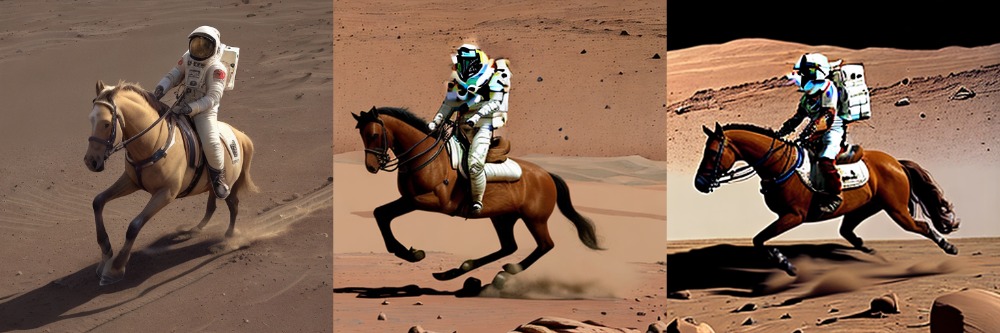

In [10]:
from diffusers.utils import make_image_grid
images = [image_3_gs,image_7_gs,image_10_gs]
make_image_grid(images,rows=1,cols=3)

### 1.7 Specify the image size

  0%|          | 0/30 [00:00<?, ?it/s]

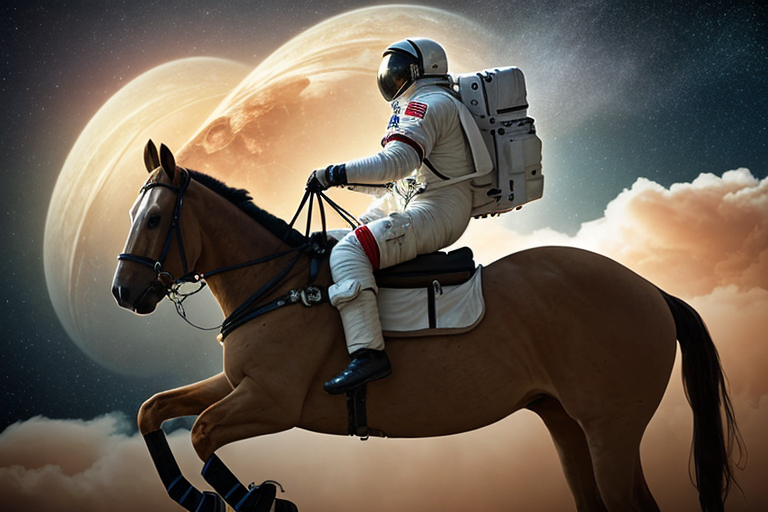

In [132]:
prompt = "high resolution, a photograph of an astronaut riding a horse"
image = text2img_pipe(
    prompt = prompt
    , num_inference_steps = 30
    , guidance_scale = 7.5
    , width = 768
    , height = 512
    , generator = torch.Generator("cuda:0").manual_seed(4) 
).images[0]
image

## Text Guided Image Inpainting

In [30]:
# load CLIPSeg 
from transformers import CLIPSegProcessor,CLIPSegForImageSegmentation

processor = CLIPSegProcessor.from_pretrained(
    "CIDAS/clipseg-rd64-refined"
)
model = CLIPSegForImageSegmentation.from_pretrained(
    "CIDAS/clipseg-rd64-refined"
)

torch.Size([352, 352])


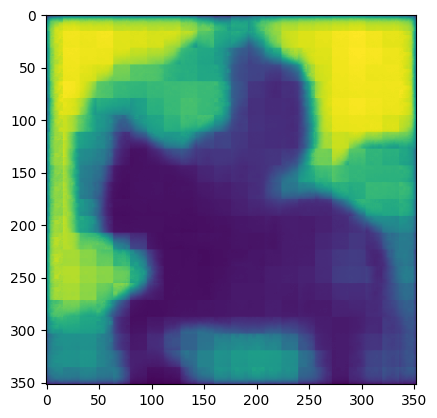

In [133]:
# generate mask data
import matplotlib.pyplot as plt
import torch

prompts = ['the background']
inputs = processor(
    text             = prompts
    , images         = [image] * len(prompts)
    , padding        = True
    , return_tensors = "pt"
)

with torch.no_grad():
    outputs = model(**inputs)

preds = outputs.logits

mask_data = torch.sigmoid(preds)
print(mask_data.shape)
plt.imshow(mask_data)

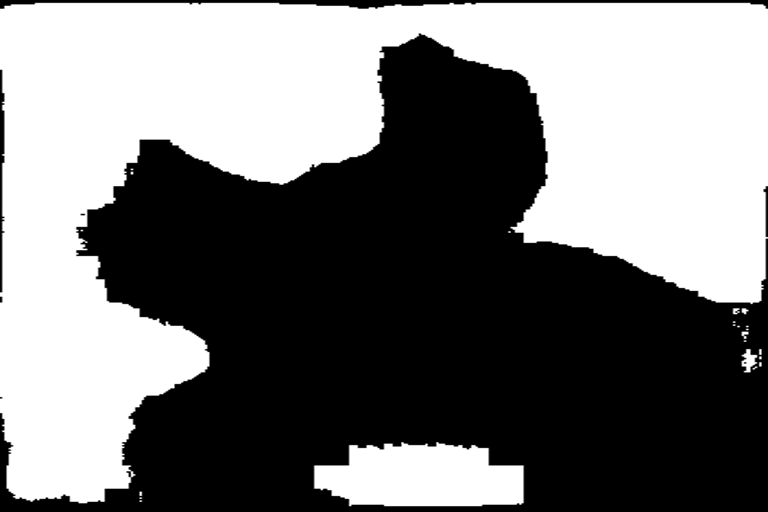

In [158]:
# genearte mask binary image
import cv2
from PIL import Image
mask_file_name = f"bg_mask.png"
plt.imsave(mask_file_name,mask_data) 
mask_data_cv = cv2.imread(mask_file_name) # -> (352, 352, 3)

def get_mask_img(mask_data):
    gray_image = cv2.cvtColor(mask_data,cv2.COLOR_BGR2GRAY)
    thresh, bw_image = cv2.threshold(gray_image,100,255,cv2.THRESH_BINARY)
    cv2.cvtColor(bw_image, cv2.COLOR_BGR2RGB)
    return Image.fromarray(bw_image)

bw_image = get_mask_img(mask_data=mask_data_cv)
#cv2.imwrite(bw_image)
bw_image = bw_image.resize((768,512))
bw_image

In [108]:
from diffusers import StableDiffusionInpaintPipeline, EulerDiscreteScheduler
inpaint_pipe = StableDiffusionInpaintPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4"
    #"runwayml/stable-diffusion-inpainting"
    , torch_dtype = torch.float16
    , safety_checker = None
).to("cuda:0")
#inpaint_pipe.enable_model_cpu_offload()


unet\diffusion_pytorch_model.safetensors not found
d:\az_git_folder\azcode\azcode_venv_win_p310\lib\site-packages\diffusers\pipelines\pipeline_utils.py:944: FutureWarning: You are using a legacy checkpoint for inpainting with Stable Diffusion, therefore we are loading the <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_inpaint_legacy.StableDiffusionInpaintPipelineLegacy'> class instead of <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_inpaint.StableDiffusionInpaintPipeline'>. For better inpainting results, we strongly suggest using Stable Diffusion's official inpainting checkpoint: https://huggingface.co/runwayml/stable-diffusion-inpainting instead or adapting your checkpoint CompVis/stable-diffusion-v1-4 to the format of https://huggingface.co/runwayml/stable-diffusion-inpainting. Note that we do not actively maintain the {StableDiffusionInpaintPipelineLegacy} class and will likely remove it in version 1.0.0.
  deprecate("StableDiffusionI

  0%|          | 0/50 [00:00<?, ?it/s]

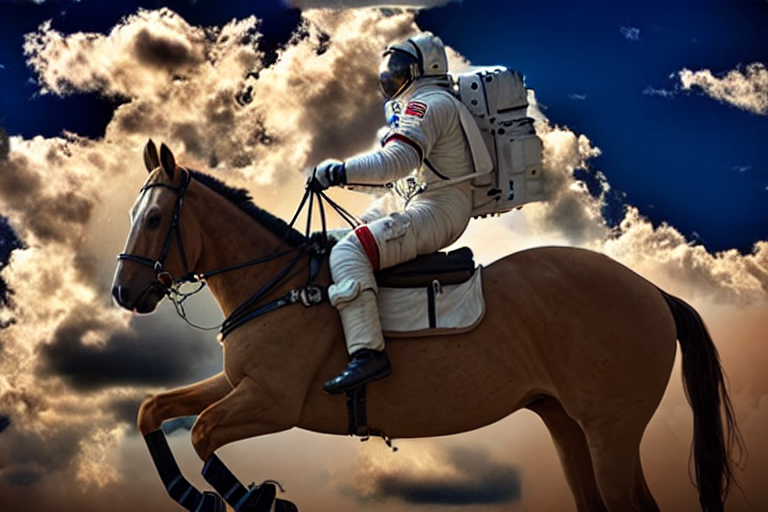

In [175]:
prompt = "blue sky, clouds"
inpaint_pipe.scheduler = EulerDiscreteScheduler.from_config(inpaint_pipe.scheduler.config)
inpaint_image = inpaint_pipe(
    prompt                  = prompt
    , image                 = image
    , mask_image            = bw_image
    , num_inference_steps   = 50
    , guidance_scale        = 9
    , strength              = 1
    #, width                 = 768
    #, height                = 512
    , generator             = torch.Generator("cuda:0").manual_seed(1) 
).images[0]
inpaint_image

## Using Img2Img pipeline

In [162]:
import torch 
from diffusers import (
    StableDiffusionImg2ImgPipeline
    , EulerDiscreteScheduler
)

import torch
from diffusers import StableDiffusionPipeline
img2img_pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "stablediffusionapi/deliberate-v2"
    , torch_dtype = torch.float16
).to("cuda:0")


safety_checker\model.safetensors not found
d:\az_git_folder\azcode\azcode_venv_win_p310\lib\site-packages\transformers\models\clip\feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


  0%|          | 0/25 [00:00<?, ?it/s]

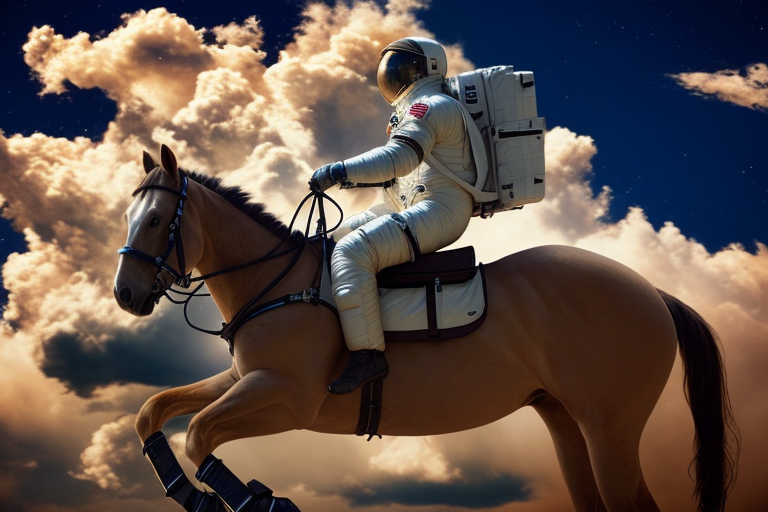

In [180]:
img2img_pipe.scheduler = EulerDiscreteScheduler.from_config(img2img_pipe.scheduler.config)
prompt = "super clear details, high resolution, a photograph of an astronaut riding a horse"
img2img_pipe.scheduler = EulerDiscreteScheduler.from_config(inpaint_pipe.scheduler.config)
fixed_image = img2img_pipe(
    image                   = inpaint_image
    , prompt                = prompt
    , num_inference_steps   = 50
    , guidance_scale        = 7.5
    , strength              = 0.5
).images[0]
fixed_image


## Add detail to image using img2img

  0%|          | 0/50 [00:00<?, ?it/s]

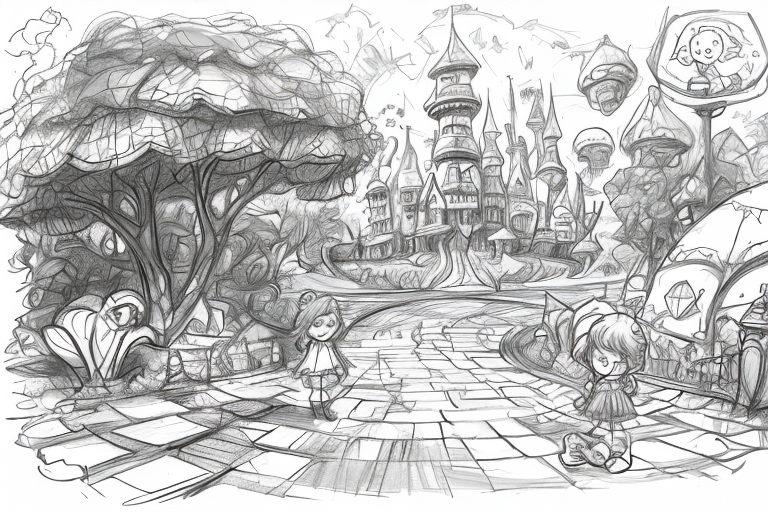

In [243]:
prompt = "child sketch of a wonderland"
image = text2img_pipe(
    prompt = prompt
    , generator = torch.Generator("cuda:0").manual_seed(1234)
    , width = 768
    , height = 512
).images[0]
image

  0%|          | 0/36 [00:00<?, ?it/s]

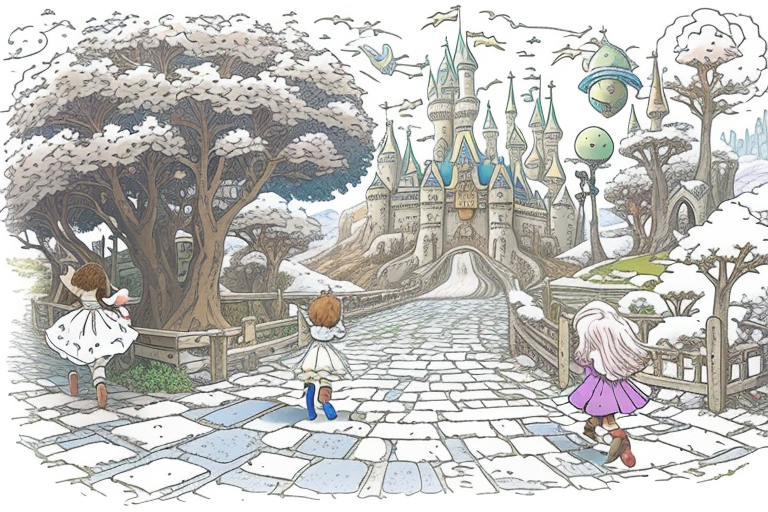

In [246]:
enrich_prompt = "a fantasy wonderland with castles, colorful, two kids on the road"
neg_prompt = "black white sketch, gray scale"

img2img_w_details = img2img_pipe(
    prompt                  = enrich_prompt
    , negative_prompt       = neg_prompt
    , image                 = image
    , num_inference_steps   = 120
    , guidance_scale        = 16
    , strength              = 0.3
    , generator             = torch.Generator("cuda:0").manual_seed(1)
).images[0]
img2img_w_details